In [1]:
# this is to make the Jupyter notebook as wide as the screen (on the Mac at least)
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
%config InlineBackend.figure_format ='retina'

# Plot time vs. depth section of selected BGC-Argo dataset (Sprof)

## Code:

### Import needed modules

In [108]:
import numpy as np
import xarray as xr
import scipy.interpolate as spint
import os
import glob

# Plotting
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker
from mpl_toolkits.axes_grid1 import make_axes_locatable

import ipdb

from pylab import *
from matplotlib import dates

from datetime import datetime, timedelta
from datetime import date

import cmocean
import matplotlib.dates as mdates

import holteandtalley as ht
import gsw

# from bgc import medfilt1

import pandas as pd

In [109]:
# medfilt1 function similar to Octave's that does not bias extremes of dataset towards zero
def medfilt1(data, kernel_size, endcorrection='shrinkkernel'):
     """One-dimensional median filter"""
     halfkernel = int(kernel_size/2)
     data = np.asarray(data)

     filtered_data = np.empty(data.shape)
     filtered_data[:] = np.nan

     for n in range(len(data)):
         i1 = np.nanmax([0, n-halfkernel])
         i2 = np.nanmin([len(data), n+halfkernel+1])
         filtered_data[n] = np.nanmedian(data[i1:i2])

     return filtered_data

In [110]:
# # function to define adaptive median filtering based on Christina Schallemberg's suggestion for CHLA
# def adaptive_medfilt1(x, y, PLOT=False):
#     # applies a median filtering followin Christina Schlallemberb's recommendations
#     # x is PRES
#     # y is BBP
    
    
# #     x = PRES[innan]
# #     y = BBP700[innan]

#     # compute x resolution
#     xres = np.diff(x)

#     # initialise medfiltered array
#     ymf = np.zeros(y.shape)*np.nan

#     ir_LT1 = np.where(xres<1)[0]
#     if np.any(ir_LT1):
#         win_LT1 = 11.
#         ymf[ir_LT1] = medfilt1(y[ir_LT1], win_LT1)   

#     ir_13 = np.where((xres>=1) & (xres<=3))[0]
#     if np.any(ir_13):
#         win_13 = 7.
#         ymf[ir_13] = medfilt1(y[ir_13], win_13)   

#     ir_GT3 = np.where(xres>3)[0]
#     if np.any(ir_GT3):
#         win_GT3 = 5.
#         ymf[ir_GT3] = medfilt1(y[ir_GT3], win_GT3)   

#     if PLOT:
#         plt.plot(np.log10(y), x, 'o')
#         plt.plot(np.log10(ymf), x, 'r-')
    
#     return ymf

In [148]:

## Input data: 

# #SAG
# DAC = "coriolis"
# WMO = "3902125" 
# WMO = '6901437'
# DAC = "bodc"
# WMO = "3901496" 

# # NASG
# DAC = "bodc"
# WMO = "6901182" 
# WMO = "6901183" 
# WMO = "6901152"
# 
# DAC = "coriolis"
# WMO = "6901473"

# DAC = "aoml"
# WMO = "5906439"
# WMO = "5906435"
# WMO = "5906440"
# WMO = "6903719"
# WMO = "5906436"
# WMO = "5906340"
# WMO = "5904664"
# DAC = 'coriolis'
# WMO = "6901472"
# WMO = "6901473"

# Riser and Johnson 2008
DAC = "aoml"
# WMO = "4900093" # original
# WMO = "5900420" # original
# WMO = "5904655" # similar
# WMO = "5906040" # similar 
# WMO = "5904124" # similar # near HOT
WMO = "5904841" # south Pacific
# WMO = "5905104" # south Pacific


MAIN_DIR = "/data/datasets/Argo/Original/dac/" 
fn = glob.glob(MAIN_DIR + DAC + "/" + WMO + "/" + WMO + "_Sprof.nc")
print(fn)
# VAR2PLOT = "PH_IN_SITU_TOTAL"
# VAR2PLOT = "NITRATE"
# VAR2PLOT = "DOXY"
VAR2PLOT = "DOXY"
# VAR2PLOT = "CHLA"
# VAR2PLOT = "TEMP"
# VAR2PLOT = "PSAL"

DIR_OUT = "./output_plots/"

['/data/datasets/Argo/Original/dac/aoml/5904841/5904841_Sprof.nc']


### Read Sprof data

In [149]:
ds = xr.open_mfdataset(fn, combine='nested', concat_dim='time')
ds

<xarray.Dataset>
Dimensions:                          (N_CALIB: 1, N_LEVELS: 560, N_PARAM: 8, N_PROF: 160, time: 1)
Dimensions without coordinates: N_CALIB, N_LEVELS, N_PARAM, N_PROF, time
Data variables: (12/86)
    DATA_TYPE                        (time) object b'Argo synthetic profile  ...
    FORMAT_VERSION                   (time) object b'1.0 '
    HANDBOOK_VERSION                 (time) object b'1.2 '
    REFERENCE_DATE_TIME              (time) object b'19500101000000'
    DATE_CREATION                    (time) object b'20211213220613'
    DATE_UPDATE                      (time) object b'20211213220613'
    ...                               ...
    NITRATE                          (time, N_PROF, N_LEVELS) float32 dask.array<chunksize=(1, 160, 560), meta=np.ndarray>
    NITRATE_QC                       (time, N_PROF, N_LEVELS) object dask.array<chunksize=(1, 160, 560), meta=np.ndarray>
    NITRATE_dPRES                    (time, N_PROF, N_LEVELS) float32 dask.array<chunksize=(1, 160, 560), meta=np.ndarray>
    NITRATE_ADJUSTED                 (time, N_PROF, N_LEVELS) float32 dask.array<chunksize=(1, 160, 560), meta=np.ndarray>
    NITRATE_ADJUSTED_QC              (time, N_PROF, N_LEVELS) object dask.array<chunksize=(1, 160, 560), meta=np.ndarray>
    NITRATE_ADJUSTED_ERROR           (time, N_PROF, N_LEVELS) float32 dask.array<chunksize=(1, 160, 560), meta=np.ndarray>
Attributes:
    title:                Argo float vertical profile
    institution:          AOML
    source:               Argo float
    history:              2021-12-13T22:06:13Z creation (software version 1.1...
    references:           http://www.argodatamgt.org/Documentation
    user_manual_version:  1.0
    Conventions:          Argo-3.1 CF-1.6
    featureType:          trajectoryProfile
    software_version:     1.11 (version 30.06.2020 for ARGO_simplified_profile)

In [150]:
# make X same size as ds.PRES
X = np.tile(ds.JULD.values.squeeze(), (ds.PRES.values.squeeze().shape[1],1))
Y = ds.PRES.values.transpose().squeeze()
Z = ds[VAR2PLOT].values.transpose().squeeze()

if 'DOXY' in ds.data_vars:
    DOXY = ds['DOXY'].values.transpose().squeeze()
if 'DOXY_ADJUSTED' in ds.data_vars:    
    DOXY_adj = ds['DOXY_ADJUSTED'].values.transpose().squeeze()
if 'BBP700' in ds.data_vars:    
    BBP700 = ds['BBP700'].values.transpose().squeeze()
if 'CHLA' in ds.data_vars:    
    CHLA = ds['CHLA'].values.transpose().squeeze()
if 'CHLA_ADJUSTED' in ds.data_vars:    
    CHLA_adj = ds['CHLA_ADJUSTED'].transpose().values.squeeze()
if 'NITRATE' in ds.data_vars:    
    NO3 = ds['NITRATE'].transpose().values.squeeze()
if 'NITRATE_ADJUSTED' in ds.data_vars:    
    NO3_adj = ds['NITRATE_ADJUSTED'].transpose().values.squeeze()
if 'DOWN_IRRADIANCE380' in ds.data_vars:
    ED380 = ds['DOWN_IRRADIANCE380'].values.transpose().squeeze()
if 'DOWN_IRRADIANCE412' in ds.data_vars:
    ED412 = ds['DOWN_IRRADIANCE412'].values.transpose().squeeze()
if 'DOWN_IRRADIANCE490' in ds.data_vars:
    ED490 = ds['DOWN_IRRADIANCE490'].values.transpose().squeeze()
if 'DOWNWELLING_PAR' in ds.data_vars:
    PAR = ds['DOWNWELLING_PAR'].values.transpose().squeeze()


### Compute Kd

In [151]:
# it = 0
# innan = np.where(np.isfinite(ED380[it,:]))[0]
# innan = np.where(~np.isnan(ED380[it,:]))[0]
# T = []
# for iz,tmp in enumerate(innan[1:]):
#     print(iz)
#     T.append(ED380[iz,innan[iz]]/ED380[it,innan[iz-1]])
# plt.plot(np.log(T), Y[0,1:])

In [152]:
# Kd380 = np.empty(ED380.shape)
# Kd380 = np.nan
# Kd412 = np.empty(ED380.shape)
# Kd412 = np.nan
# Kd490 = np.empty(ED380.shape)
# Kd490 = np.nan

# for ip,tmp in enumerate(X[:,0]):
#     innan = np.where(np.isfinite(ED380[it,:]))[0]
#     T = ED380[it,innan]/ED380[it,innan[0]]
    
    

### Compute sigma theta

In [153]:
P = ds.PRES.values.transpose().squeeze()
T = ds.TEMP.values.transpose().squeeze()
S = ds.PSAL.values.transpose().squeeze()
LAT = np.tile(ds.LATITUDE.values.squeeze(), (P.shape[0],1))
LON = np.tile(ds.LONGITUDE.values.squeeze(), (P.shape[0],1))
SA = gsw.SA_from_SP(S, P, LON, LAT)
CT = gsw.CT_from_t(SA, T, P)
sigma0 = gsw.sigma0(SA, CT)


# compute oxygen saturation
O2SOL = gsw.O2sol(SA, CT, P, LON, LAT)
if 'DOXY_ADJUSTED' in locals():  
    prcntO2sat = DOXY_adj/O2SOL*100.
elif 'DOXY' in locals():  
    prcntO2sat = DOXY/O2SOL*100.
else:
    prcntO2sat = DOXY*np.nan()

In [154]:
# remove profiles with PRES<10
i2del = np.empty(P.shape[1], dtype=bool)
for ip in range(P.shape[1]):
    if np.nanmax(P[:,ip]) < 10:
        i2del[ip] = True
# i2del = np.where(i2del==True)[0]
i2del = np.where(i2del==True)[0]

In [155]:
X = np.delete(X, i2del, axis=1)
Y = np.delete(Y, i2del, axis=1)
Z = np.delete(Z, i2del, axis=1)
LAT = np.delete(LAT, i2del, axis=1)
LON = np.delete(LON, i2del, axis=1)
P = np.delete(P, i2del, axis=1)
T = np.delete(T, i2del, axis=1)
S = np.delete(S, i2del, axis=1)
sigma0 = np.delete(sigma0, i2del, axis=1)

if 'CHLA' in locals():
    CHLA = np.delete(CHLA, i2del, axis=1)
if 'CHLA_adj' in locals():
    CHLA_adj = np.delete(CHLA_adj, i2del, axis=1)
if 'DOXY' in locals():
    DOXY = np.delete(DOXY, i2del, axis=1)
if 'DOXY_adj' in locals():
    DOXY_adj = np.delete(DOXY_adj, i2del, axis=1)
if 'prcntO2sat' in locals():
    prcntO2sat = np.delete(prcntO2sat, i2del, axis=1)
if 'NO3' in locals():
    NO3 = np.delete(NO3, i2del, axis=1)
if 'NO3_adj' in locals():
    NO3_adj = np.delete(NO3_adj, i2del, axis=1)
if 'BBP700' in locals():
    BBP700 = np.delete(BBP700, i2del, axis=1)

if 'PAR' in locals():
    ED380 = np.delete(ED380, i2del, axis=1)
    ED412 = np.delete(ED412, i2del, axis=1)
    ED490 = np.delete(ED490, i2del, axis=1)
    PAR = np.delete(PAR, i2del, axis=1)


In [156]:
# define min and max dates
datemin = pd.Timestamp(ds.JULD.values.squeeze().min()).to_pydatetime()
datemax = pd.Timestamp(ds.JULD.values.squeeze().max()).to_pydatetime()


/users/modellers/gdal/miniconda3/envs/OLTraj/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3319: UserWarning: Discarding nonzero nanoseconds in conversion
  exec(code_obj, self.user_global_ns, self.user_ns)
/users/modellers/gdal/miniconda3/envs/OLTraj/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3319: UserWarning: Discarding nonzero nanoseconds in conversion
  exec(code_obj, self.user_global_ns, self.user_ns)


In [157]:
# deals with time vectors for interpolation and plotting

# function to convert datetime to matlab time for interpolation
def datetime2matlabdn(dt):
    import datetime
    mdn = dt + timedelta(days = 366)
    frac_seconds = (dt-datetime.datetime(dt.year,dt.month,dt.day,0,0,0)).seconds / (24.0 * 60.0 * 60.0)
    frac_microseconds = dt.microsecond / (24.0 * 60.0 * 60.0 * 1000000.0)
    return mdn.toordinal() + frac_seconds + frac_microseconds

# compute matlab time array
m = map(datetime2matlabdn, pd.to_datetime(X[0,:]) )
mattime = np.asarray(list(m))
Xmat = tile(mattime, (X.shape[0],1))

# convert mattime to np.datetime64
XfromXmat = pd.to_datetime(mattime-719529, unit='D')
XfromXmat = tile(XfromXmat, (X.shape[0],1))



(300, 0)

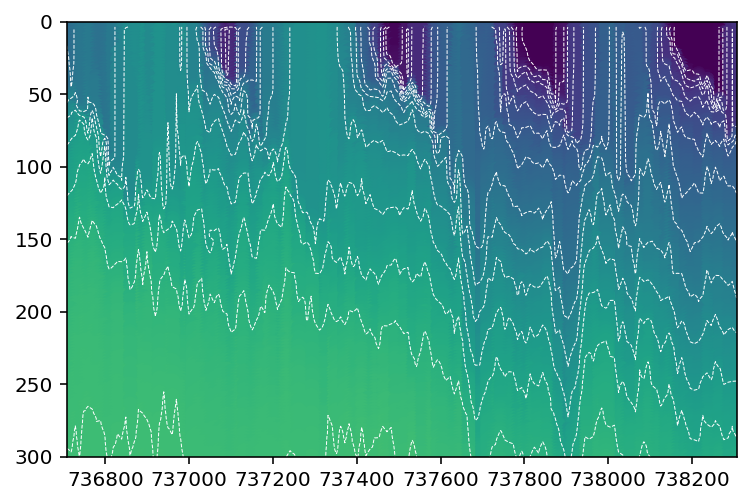

In [158]:
# create gridded dataset to compute contours
import scipy

#    # Set up a regular grid of interpolation points
xi = np.linspace(Xmat.min(), Xmat.max(), Xmat.shape[1])
yi = np.linspace(0, 1000, Xmat.shape[0])
xi, yi = np.meshgrid(xi, yi)

#    # Interpolate; there's also method='cubic' for 2-D data such as here
innan = np.where( (~np.isnan(Y.flatten())) &
                  (~np.isnan(sigma0.flatten())))[0]

zi = scipy.interpolate.griddata(( Xmat.flatten()[innan], Y.flatten()[innan] ), 
                                sigma0.flatten()[innan], 
                                (xi, yi), method='linear')
#
plt.scatter(Xmat, Y, s = 64, c = sigma0, marker='o', edgecolors='none', vmin = 24.52, vmax = 28.01)
CS = plt.contour(xi, yi, zi, linspace(24.52, 28.01, 20), colors='w', linewidths = 0.5, linestyles = '--')
plt.ylim([300, 0])


In [159]:
# innan = np.where( (~np.isnan(Y.flatten())) &
#                   (~np.isnan(BBP700.flatten())))[0]
# bbpi = scipy.interpolate.griddata(( Xmat.flatten()[innan], Y.flatten()[innan] ), 
#                                 BBP700.flatten()[innan], 
#                                 (xi, yi), method='linear')
# #
# fig, ax = plt.subplots(1,1, figsize=(20,5))
# # plt.scatter(Xmat, Y, s = 64, c = BBP700, marker='o', edgecolors='none', vmin = 0.0001, vmax = 0.0003)
# CS = ax.contour(xi, yi, bbpi, linspace(0.0001, 0.0005, 10), colors='k', linewidths = 0.5, linestyles = '--')
# ax.set_ylim([600, 0])



In [160]:
# # export lat, lon, time for Bruno
# import pandas as pd
# # create dictionary
# lat_lon_time = { "lat": LAT[0,:], 
#                  "lon": LON[0,:], 
#                  "time": X[:,0]  }
# # create pandas dataframe
# df = pd.DataFrame (lat_lon_time, columns = ['lat','lon','time'])

# # write to csv file
# df.to_csv("lat_lon_time.dat")

### Estimate MLD using Bouyer Montegut's algorithm

In [161]:
zm_s = np.zeros(P.shape[1])
zm_T = np.zeros(P.shape[1])
zm_S = np.zeros(P.shape[1])

for i in range(P.shape[1]): 

    PTSs = np.vstack([P[:,i].squeeze(), T[:,i].squeeze(), S[:,i].squeeze(), sigma0[:,i].squeeze()])
    innan = np.where(~np.isnan(PTSs[0,:]))[0]

#     innan = np.where(~np.isnan(PTSs).any(axis=0))[0]
    if innan.size<13: # check that there are enough data points
        zm_s[i] = np.nan
        zm_S[i] = np.nan
        zm_T[i] = np.nan
#         print(i)
        continue  
    PTSs = PTSs[:,innan].T

    # find closest pressure to 10 dbars for this profile and extract T and sigma0
    if np.nanmin(PTSs[:,0])>10:
        zm_T[i] = zm_S[i] = zm_s[i] = np.nan
        continue
    i10dbars = np.where(abs(PTSs[:,0]-10)==min(abs(PTSs[:,0]-10)))[0][0]
    T10dbars = PTSs[i10dbars,1]
    s10dbars = PTSs[i10dbars,3]
    
    # find depth at which T decreases by 0.3 degs
    Tdiff = abs( abs(PTSs[i10dbars:-1,1] - T10dbars) - 0.3 )
    izm_T = np.where(Tdiff==min(Tdiff))[0][0] + i10dbars
    zm_T[i] = PTSs[izm_T,0]
    
    # find depth at which sigma0 increases by 0.02 degs
    sdiff = abs( abs(PTSs[:,3] - s10dbars) - 0.03 )
    izm_s = np.where(sdiff==min(sdiff))[0][0] + i10dbars
    zm_s[i] = PTSs[izm_s,0]
    zm_S[i] = np.nan

### Estimate MLD using Holte and Talley (2009) algorithm

In [162]:
# zm_s = np.zeros(P.shape[1])
# zm_T = np.zeros(P.shape[1])
# zm_S = np.zeros(P.shape[1])

# for i in range(P.shape[1]): 
#     print(i)
#     PTSs = np.array([P[:,i].squeeze(), T[:,i].squeeze(), S[:,i].squeeze(), sigma0[:,i].squeeze()]).transpose()
#     innan = np.where(~np.isnan(PTSs).any(axis=1))
#     if innan[0].size<10: # check that there are enough data points
#         zm_s[i] = np.nan
#         zm_S[i] = np.nan
#         zm_T[i] = np.nan
# #         print(i)
#         continue  
#     PTSs = PTSs[innan,:][0]
#     tmpzm = ht.HolteAndTalley(PTSs[:,0], PTSs[:,1], PTSs[:,2], PTSs[:,3])    
# #     tmpzm = ht.HolteAndTalley(PTSs[:,0], PTSs[:,1])    
#     zm_T[i] = tmpzm.tempMLD
#     zm_s[i] = tmpzm.densityMLD
#     zm_S[i] = tmpzm.salinityMLD

### Compute potential vorticity


In [129]:
# # P = ds.PRES.values.transpose().squeeze()
# # T = ds.TEMP.values.transpose().squeeze()
# # S = ds.PSAL.values.transpose().squeeze()
# # LAT = np.tile(ds.LATITUDE.values.squeeze(), (P.shape[0],1))
# # LON = np.tile(ds.LONGITUDE.values.squeeze(), (P.shape[0],1))

# import seawater as sw
# N2 = np.empty(S.T.shape)
# N2[:] = np.nan
# PV = np.empty(S.T.shape)
# PV[:] = np.nan
# for ic,itmpc in enumerate(S[0,:]):
#     [tmpN2, tmpPV, tmp] = sw.geostrophic.bfrq(S.T[ic], np.array(T).T[ic], P.T[ic], LAT[ic][0])
#     N2[ic][:-1] = tmpN2.squeeze()
#     PV[ic][:-1] = tmpPV.squeeze()
# N2 = N2.T
# PV = PV.T

### Variable plot parameters

In [130]:
# # glob CCI files
# DIRCCI = "/data/datasets/CCI/v5.0-release/geographic/netcdf/8day/all_products/"
# fnCCI = glob.glob(DIRCCI + "*/*nc")

# # extract CCI dates
# dateCCI = []
# for iCCI in fnCCI:
#     dateobj = datetime.strptime(iCCI.split("-")[-2], '%Y%m%d')
#     dateCCI.append(dateobj)

    
    
# # extract indices of CCI dates matching float dates
# dateFLOATmin = datetime.strptime(XSTART, '%Y-%m-%d')
# dateFLOATmax = datetime.strptime(XEND, '%Y-%m-%d')

# idatesCCI = np.where((np.asarray(dateCCI)>=dateFLOATmin) & (np.asarray(dateCCI)<=dateFLOATmax))[0]
# # print([XSTART, XEND])
# # print([dateCCI[idatesCCI[0]], dateCCI[idatesCCI[-1]]])

# fnCCI2open = [fnCCI[i] for i in idatesCCI]

In [131]:
# # open CCI files
# ds_cci = xr.open_mfdataset(fnCCI2open, decode_times=False, concat_dim='time')

In [164]:
# # convert time stamps in CCI data
# ds_cci2 = xr.decode_cf(ds_cci)

In [165]:
# # read chlor_a for each float date at the closest coordinate
# chl_lat = []
# chl_lon = []
# chl_time = []
# chl_med = []
# bbp_med = []

# # chl_prc = []
# for it,iX in enumerate(X[0,:]):
#     print("%s / %s" % (it+1, len(X[0,:])))
# #     tmp = ds_cci2.sel(time=X[0,:].astype(str)[:10], lon=LON[0,it], lat=LAT[0,it], method="nearest")
#     tmp = ds_cci2.sel(time=X[0,it].astype(str), lon=LON[0,it], lat=LAT[0,it], method="nearest")
#     chl_lat.append(tmp.lat.values)
#     chl_lon.append(tmp.lon.values)
#     chl_time.append(tmp.time.values)
# #     print(it, "       ", str(tmp.time.values), "     ", X[it,0].astype(str)[:10])
#     if tmp.chlor_a.values.size>0:
#           chl_med.append(tmp.chlor_a.values)
#     else:
#           chl_med.append(np.nan)
#     if tmp.bbp_443.values.size>0:
#           bbp_med.append(tmp.bbp_443.values)
#     else:
#           bbp_med.append(np.nan)
          
    

In [166]:
# create output directory if it does not exist
from pathlib import Path
Path(DIR_OUT+WMO).mkdir(parents=True, exist_ok=True)
    

In [167]:
# define geographical extent of map
dLAT = dLON = 1
LATS = [np.nanmin(LAT) - dLAT, np.nanmax(LAT) + dLAT]
LONS = [np.nanmin(LON) - dLON, np.nanmax(LON) + dLON]


In [168]:
# plot bathymetry
import rockhound as rh

# Load a version of the topography grid
grid = rh.fetch_etopo1(version="bedrock")
# print(grid)

# Select a subset that corresponds to Africa to make plotting faster given the
# size of the grid.
etopo = grid.sel(latitude=slice(LATS[0], LATS[1]), longitude=slice(LONS[0], LONS[1]))


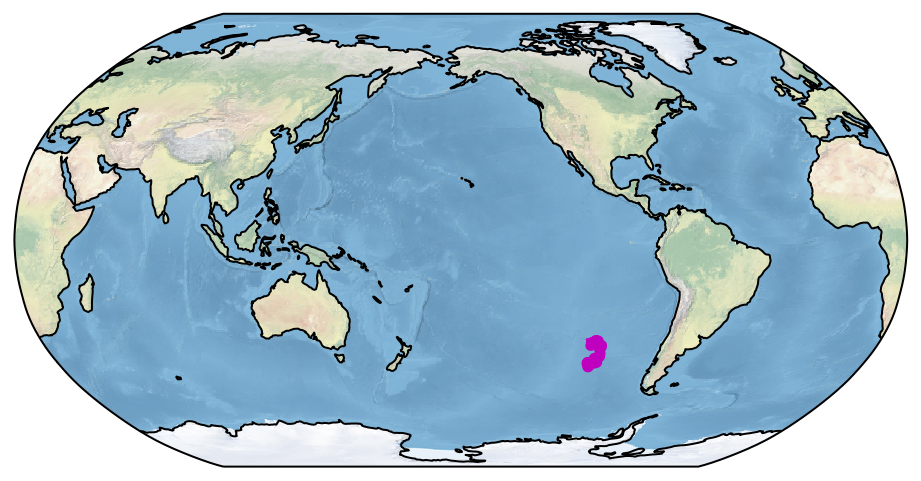

In [169]:
# plot global map
import cartopy.crs as ccrs

fig = plt.figure(figsize=(8, 5))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson(central_longitude=200))

# make the map global rather than have it zoom in to
# the extents of any plotted data
ax.set_global()

ax.stock_img()
ax.coastlines()

ax.plot(LON[0,:], LAT[0,:], transform=ccrs.PlateCarree(), c='m', lw=5)

fig.savefig(DIR_OUT+WMO+"/"+ WMO+"_global_map.png")

/users/modellers/gdal/miniconda3/envs/OLTraj/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: Use the colorbar set_ticks() method instead.


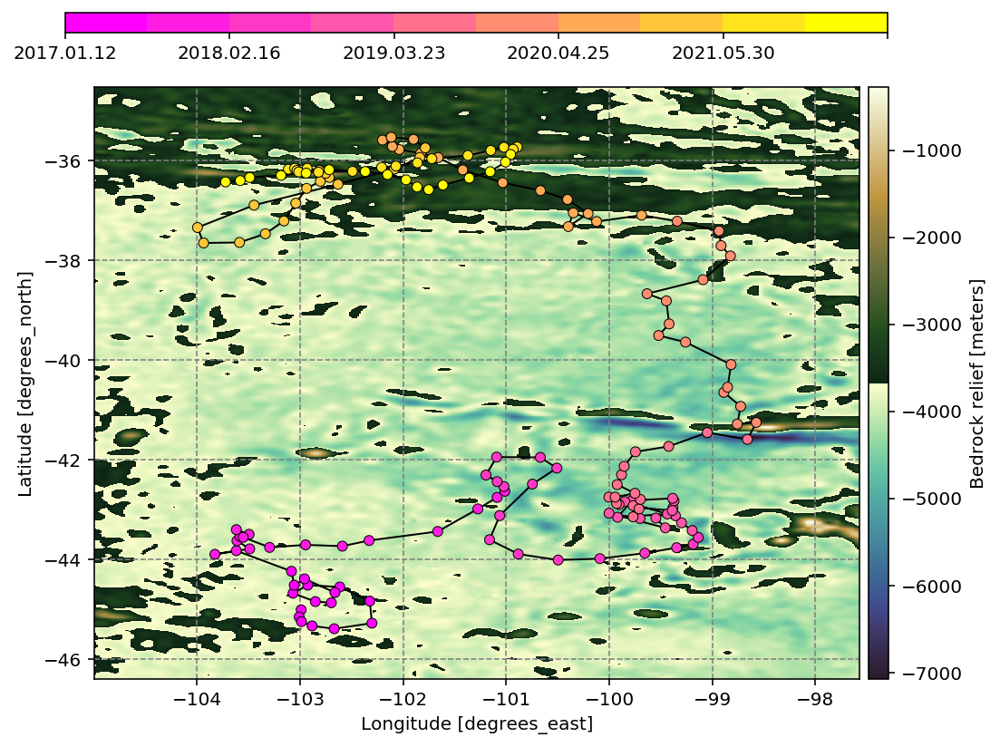

In [170]:
# plot the CCI data
# ds2plot = ds_cci2.chlor_a.sel(time="2013-11-08", method="nearest")
f = plt.figure(figsize=(9, 6))
ax1 = f.add_subplot(1,1,1)
# p = ds2plot.plot(ax=ax1, norm=matplotlib.colors.LogNorm(vmin=0.02, vmax=10))
# ax1.gca().coastlines()

etopo.bedrock.plot.pcolormesh(
    cmap=cmocean.cm.topo, cbar_kwargs=dict(pad=0.01, aspect=30), ax=ax1)

ax1.set_xlim((LONS))
ax1.set_ylim((LATS))

# ax1.set_ylim((-27, -17))
# ax1.set_xlim((-45, -20))


CMAP_time = plt.get_cmap('spring', 10)
ax1.scatter(LON[0,:], LAT[0,:], s=30, c=np.asarray(X[0,:]).astype(int), 
            edgecolors='k', linestyle='-', lw = 0.5, zorder=60, cmap=CMAP_time, alpha=1)

ax1.grid(color='grey', ls='--')
# # array with only the most recent float times (https://stackabuse.com/converting-strings-to-datetime-in-python/)
# datemin = datetime.strptime("2018-01-01 0:0", '%Y-%m-%d %H:%M')#.date()
# ns = 1e-9
# chl_datetime = np.asarray([datetime.utcfromtimestamp(chl_time[i].astype(int) * ns)   for i in range(len(chl_time))])
# it = np.where(chl_datetime >= datemin)[0]

ax1.plot(np.asarray(LON[0,:]), np.asarray(LAT[0,:]), lw=1, c='k')
# for i in it:
#     ax1.scatter(chl_lon[i], chl_lat[i], s=20, c=chl_time[i].astype(long), edgecolors='k', linestyle='-', lw = 0.5, zorder=60, cmap=plt.get_cmap('spring'))
# ax1.scatter(np.asarray(chl_lon), np.asarray(chl_lat), s=20, c='none', edgecolors='k', linestyle='-', lw = 0.5, zorder=60, cmap=plt.get_cmap('spring'), alpha=0.75)



### prepare time colorbar
ax2 = f.add_axes([0.1, 0.95, 0.7, 0.025])
VMIN_time = X[0,:][0]
VMAX_time = X[0,:][-1]
# NORM = mpl.colors.Normalize(vmin=VMIN_time, vmax=VMAX_time)
cb1 = mpl.colorbar.ColorbarBase(ax2, cmap=CMAP_time,
                                orientation='horizontal', alpha=1)

# set time format for time colorbar
d = pd.date_range(pd.to_datetime(VMIN_time), pd.to_datetime(VMAX_time), periods=5)
cb1.ax.set_xticks(d)
cb1.ax.set_xticklabels(d.strftime('%Y.%m.%d'), fontsize=10, color='k')

f.savefig(DIR_OUT+WMO+"/"+ WMO+"_map.png")

In [171]:
if "BBP700" in locals():
    # smooth profiles
    BBP700smooth = np.empty(Z.shape)
    # Zsmooth = np.empty(Z.shape)
    for iCTD in range(Z.shape[1]):
    #     Zsmooth[:, iCTD] = medfilt1(Z[iCTD,:], 101)
        BBP700smooth[:,iCTD] = medfilt1(BBP700[:,iCTD], 101)

In [172]:
import matplotlib.colors as mcolors

def hex_to_rgb(value):
    '''
    Converts hex to rgb colours
    value: string of 6 characters representing a hex colour.
    Returns: list length 3 of RGB values'''
    value = value.strip("#") # removes hash symbol if present
    lv = len(value)
    return tuple(int(value[i:i + lv // 3], 16) for i in range(0, lv, lv // 3))

def rgb_to_dec(value):
    '''
    Converts rgb to decimal colours (i.e. divides each value by 256)
    value: list (length 3) of RGB values
    Returns: list (length 3) of decimal values'''
    return [v/256 for v in value]

def get_continuous_cmap(hex_list, float_list=None):
    ''' creates and returns a color map that can be used in heat map figures.
        If float_list is not provided, colour map graduates linearly between each color in hex_list.
        If float_list is provided, each color in hex_list is mapped to the respective location in float_list. 
        
        Parameters
        ----------
        hex_list: list of hex code strings
        float_list: list of floats between 0 and 1, same length as hex_list. Must start with 0 and end with 1.
        
        Returns
        ----------
        colour map'''
    rgb_list = [rgb_to_dec(hex_to_rgb(i)) for i in hex_list]
    if float_list:
        pass
    else:
        float_list = list(np.linspace(0,1,len(rgb_list)))
        
    cdict = dict()
    for num, col in enumerate(['red', 'green', 'blue']):
        col_list = [[float_list[i], rgb_list[i][num], rgb_list[i][num]] for i in range(len(float_list))]
        cdict[col] = col_list
    cmp = mcolors.LinearSegmentedColormap('my_cmp', segmentdata=cdict, N=256)
    return cmp

In [173]:
# # medfilt1 function similar to Octave's that does not bias extremes of dataset towards zero
# def medfilt1(data, kernel_size, endcorrection='shrinkkernel'):
#      """One-dimensional median filter"""
#      halfkernel = int(kernel_size/2)
#      data = np.asarray(data)

#      filtered_data = np.empty(data.shape)
#      filtered_data[:] = np.nan

#      for n in range(len(data)):
#          i1 = np.nanmax([0, n-halfkernel])
#          i2 = np.nanmin([len(data), n+halfkernel+1])
#          filtered_data[n] = np.nanmedian(data[i1:i2])

#      return filtered_data


In [174]:
# def adaptive_medfilt1(x, y, PLOT=False):
#     # applies a median filtering followin Christina Schlallemberb's recommendations
#     # x is PRES
#     # y is BBP
    
    
# #     x = PRES[innan]
# #     y = BBP700[innan]

#     # compute x resolution
#     xres = np.diff(x)

#     # initialise medfiltered array
#     ymf = np.zeros(y.shape)*np.nan

#     ir_LT1 = np.where(xres<1)[0]
#     if np.any(ir_LT1):
#         win_LT1 = 11.
#         ymf[ir_LT1] = medfilt1(y[ir_LT1], win_LT1)   

#     ir_13 = np.where((xres>=1) & (xres<=3))[0]
#     if np.any(ir_13):
#         win_13 = 7.
#         ymf[ir_13] = medfilt1(y[ir_13], win_13)   

#     ir_GT3 = np.where(xres>3)[0]
#     if np.any(ir_GT3):
#         win_GT3 = 5.
#         ymf[ir_GT3] = medfilt1(y[ir_GT3], win_GT3)   

#     if PLOT:
#         plt.plot(np.log10(y), x, 'o')
#         plt.plot(np.log10(ymf), x, 'r-')
    
#     return ymf


In [175]:
# # compute median values of bbp and CHLA in the mixed layer
# bbp_zm = []
# chl_zm = []
# chl_adj_zm = []
# for iCTD in range(Y.shape[0]):
#     bbp_zm.append(np.nanmedian(Z[iCTD,Y[iCTD,:]<=zm_T[iCTD]]))
#     chl_zm.append(np.nanmedian(CHLA[iCTD,Y[iCTD,:]<=zm_T[iCTD]]))
#     chl_adj_zm.append(np.nanmedian(CHLA_adj[iCTD,Y[iCTD,:]<=zm_T[iCTD]]))
    

In [176]:
ymax = 1000
xmin = datetime.strptime("2019-08-01", "%Y-%m-%d")
# xmin - datemin
plt.close("all")

In [177]:
def plot_property(X, Y, Z, 
                  CMAP = cm.get_cmap('inferno'), 
                  VMIN = np.nanpercentile(Z,  5),  
                  VMAX = np.nanpercentile(Z, 95),  
                  YMAX = np.nanmax(Y),
                  XMIN = datemin,
                  XMAX = datemax,
                  TITLE = "",
                  ZM_C = "k",
                  S0_C = "k",
                  S0_levels = np.linspace(np.nanmin(sigma0), np.nanmax(sigma0), 20),
                  LOG = False,
                  LW = 1,
                  MS = 64
                 ):

    if LOG:
        NORM = mpl.colors.LogNorm(vmin = VMIN, vmax = VMAX)
    else:
        NORM = mpl.colors.Normalize(vmin = VMIN, vmax = VMAX)
    
    f, ax = plt.subplots(1,1, figsize=(20, 6));    
    
    if LOG:
        ax.scatter(X, Y, s = MS, c = Z, 
                   marker='o', 
                   edgecolors='none', 
                   cmap = CMAP, 
                   vmin = VMIN, 
                   vmax = VMAX, 
                   norm = NORM
                  )
    else:
        ax.scatter(X, Y, s = MS, c = Z, 
                   marker='o', 
                   edgecolors='none', 
                   cmap = CMAP, 
                   vmin = VMIN, 
                   vmax = VMAX
                  )
        
#     if any(zm_s):
#         ax.plot(X[0,:], zm_s, '-', c = ZM_C, lw = 1)
    if any(zm_T):
        ax.plot(X[0,:], zm_T, '-', c = ZM_C, lw = LW)

    ax.set_facecolor('dimgrey')
    ax.set_ylim([0, YMAX])
    ax.invert_yaxis()
    ax.grid('on', ls='--')

    #####   set ticks and  labels
    days = mdates.DayLocator(interval=2)
    months = mdates.MonthLocator(interval=2)
    years = mdates.YearLocator()

    datemin_ord = XMIN.toordinal()
    datemax_ord = XMAX.toordinal()    
    
    ax.set_xlim(XMIN, XMAX)
    ax.tick_params(axis="x", which="minor", direction="out", top=True, length=10 )
    ax.tick_params(axis="x", which="major", direction="out", top=True, length=15 )


    ax.xaxis.set_minor_locator(months)
    ax.xaxis.set_major_locator(years)
    fmt = mdates.DateFormatter('%m')
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax.xaxis.set_minor_formatter(fmt)

    ax.tick_params(axis='x', which='major', direction='out', pad=25, labelsize=20)
    ax.tick_params(axis='x', which='minor', direction='out', pad=0.5, labelsize=20)
    ax.tick_params(axis='y', labelsize=20)

    ax.set_title(TITLE, fontsize=20)
    ax.set_ylabel("Pressure [dbars]", fontsize=20)




    ###prepare colorbar
    ax1 = f.add_axes([0.92, 0.125, 0.025, 0.75])
#     NORM = mpl.colors.Normalize(vmin = VMIN, vmax = VMAX)
    cb1 = mpl.colorbar.ColorbarBase(ax1, cmap = CMAP, 
                                    norm = NORM,
                                    orientation='vertical')
    imaxes = gca()
    axes(cb1.ax)
    yticks(fontsize=20)
    axes(imaxes);



    CS = ax.contour(XfromXmat, yi, zi, S0_levels, colors = S0_C, linewidths = 0.5, linestyles = '--')
    ax.clabel(CS, S0_levels, inline=True, fontsize=10, fmt="%2.2f")

#     CSedw = ax.contour(XfromXmat, yi, zi, levels=[26.3, 26.5], colors = S0_C, linewidths = 2, linestyles = '-')
#     ax.clabel(CSedw, [26.3, 26.5], inline=True, fontsize=20, fmt="%2.2f")

    return f

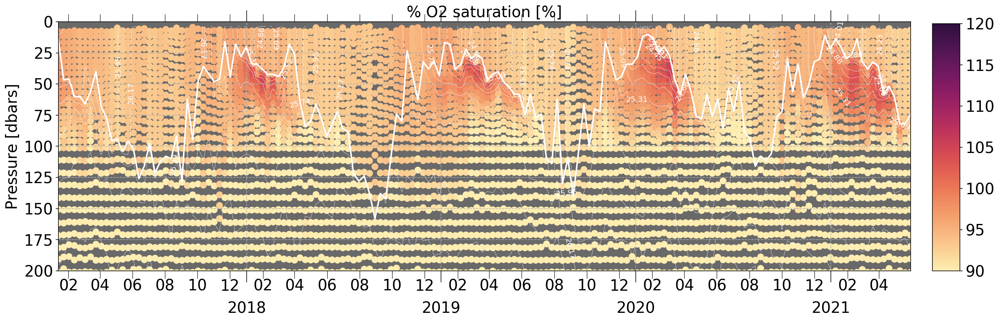

In [181]:
if "prcntO2sat" in locals():

    f = plot_property(X, Y, prcntO2sat, 
#                   CMAP = bbp_cmap, 
                  CMAP = cmocean.cm.matter,
                  VMIN = 90,
                  VMAX = 120,
#                   XMIN = xmin,
                  YMAX = 200,
                  TITLE = "% O2 saturation [%]",
                  ZM_C = 'w', # color of mixed-layer depth
                  S0_C = 'w', # color of sigma0
                  LW = 2,
                  MS = 80,
#                   LOG = True
                 )

    f.savefig(DIR_OUT+WMO+"/"+ WMO+"_prcntO2sat_" + str(ymax) + ".png")


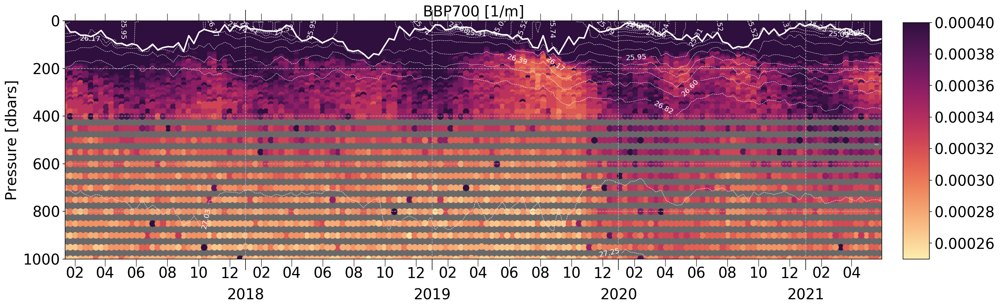

In [182]:
if "BBP700" in locals():
    hex_list = ['#090914', '#111126', '#dedb45', '#9e6f50', '#b3472c', '#702c17', '#FF66CC']
    bbp_cmap = get_continuous_cmap(hex_list, float_list=[0,  0.215, 0.3, 0.4, 0.5, 0.55, 1]) # 

    f = plot_property(X, Y, BBP700, 
#                   CMAP = bbp_cmap, 
                  CMAP = cmocean.cm.matter,
                  VMIN = 0.00025,
                  VMAX = 0.0004,
#                   XMIN = xmin,
                  YMAX = ymax,
                  TITLE = "BBP700 [1/m]",
                  ZM_C = 'w', # color of mixed-layer depth
                  S0_C = 'w', # color of sigma0
                  LW = 2,
                  MS = 80,
#                   LOG = True
                 )

    f.savefig(DIR_OUT+WMO+"/"+ WMO+"_BBP700_" + str(ymax) + ".png")


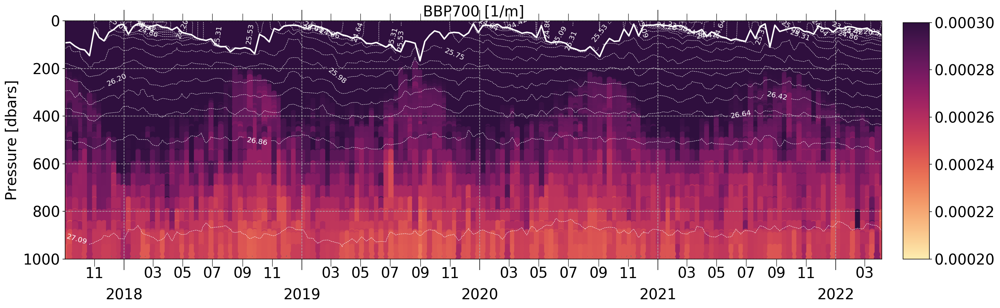

In [177]:
if "BBP700smooth" in locals():
    hex_list = ['#090914', '#111126', '#dedb45', '#9e6f50', '#b3472c', '#702c17', '#FF66CC']
    bbp_cmap = get_continuous_cmap(hex_list, float_list=[0,  0.215, 0.3, 0.4, 0.5, 0.55, 1]) # 

    f = plot_property(X, Y, BBP700smooth, 
#                   CMAP = bbp_cmap, 
                  CMAP = cmocean.cm.matter,
                  VMIN = 0.0002,
                  VMAX = 0.0003,
#                   XMIN = xmin,
                  YMAX = ymax,
                  TITLE = "BBP700 [1/m]",
                  ZM_C = 'w', # color of mixed-layer depth
                  S0_C = 'w', # color of sigma0
                  LW = 2,
                  MS = 80,
#                   LOG = True
                 )

    f.savefig(DIR_OUT+WMO+"/"+ WMO+"_BBP700smooth_" + str(ymax) + ".png")


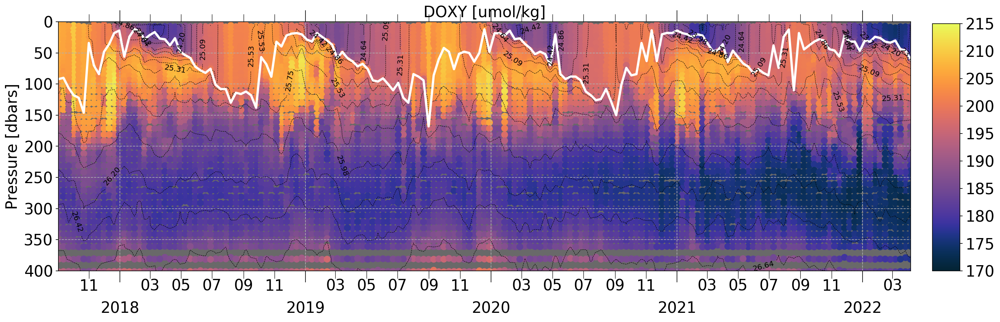

In [160]:
if "DOXY" in locals():
    f = plot_property(X, Y, DOXY, 
                  CMAP = cmocean.cm.thermal, #cm.get_cmap('cool'),
                  VMIN = 170,
                  VMAX = 215,
    #               XMIN = datetime.strptime("2018-01-01", "%Y-%m-%d"),
#                       XMAX = datetime.strptime("2015-11-01", "%Y-%m-%d"),
                  YMAX = 400,
                  TITLE = "DOXY [umol/kg]",
                  ZM_C = 'w', # color of mixed-layer depth
                  LW = 3,
                  MS = 80
                 )

    f.savefig(DIR_OUT+WMO+"/"+ WMO+"_DOXY_" + str(ymax) + ".png")



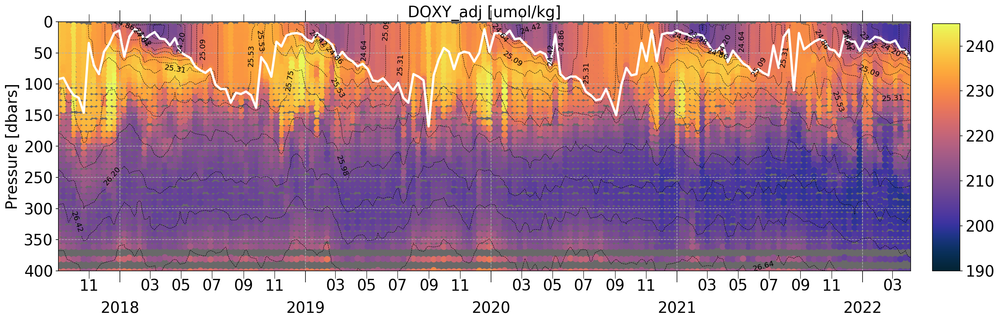

In [172]:
if "DOXY_adj" in locals():
    f = plot_property(X, Y, DOXY_adj, 
                  CMAP = cmocean.cm.thermal, #cm.get_cmap('cool'),
                  VMIN = 190,
                  VMAX = 245,
                  YMAX = 400,
                  TITLE = "DOXY_adj [umol/kg]",
                  ZM_C = 'w', # color of mixed-layer depth
                  LW = 3,
                  MS = 70
                 )

    f.savefig(DIR_OUT+WMO+"/"+ WMO+"_DOXY_adj_" + str(ymax) + ".png")



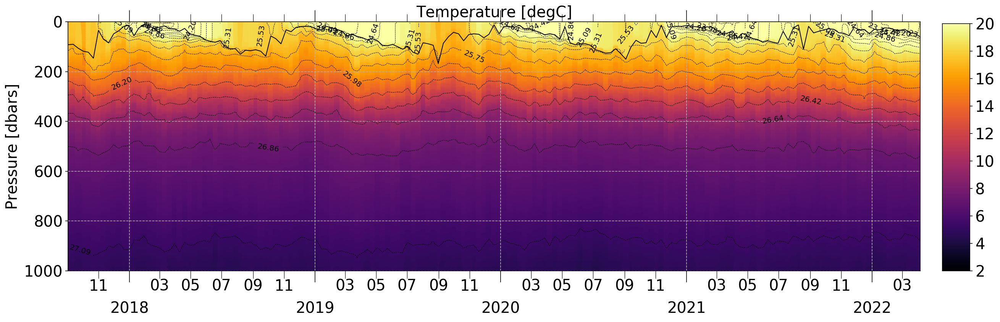

In [167]:
f = plot_property(X, Y, T, 
              CMAP = cm.get_cmap('inferno'),
              VMIN = 2,
              VMAX = 20,
#               XMIN = xmin,
              YMAX = ymax,
#               XMIN = datetime.strptime("2018-01-01", "%Y-%m-%d"),
#               XMAX = datetime.strptime("2006-01-01", "%Y-%m-%d"),
              TITLE = "Temperature [degC]",
              ZM_C = 'k',              # color of mixed-layer depth
              MS = 120    
             )

f.savefig(DIR_OUT+WMO+"/"+ WMO+"_T_" + str(ymax) + ".png")



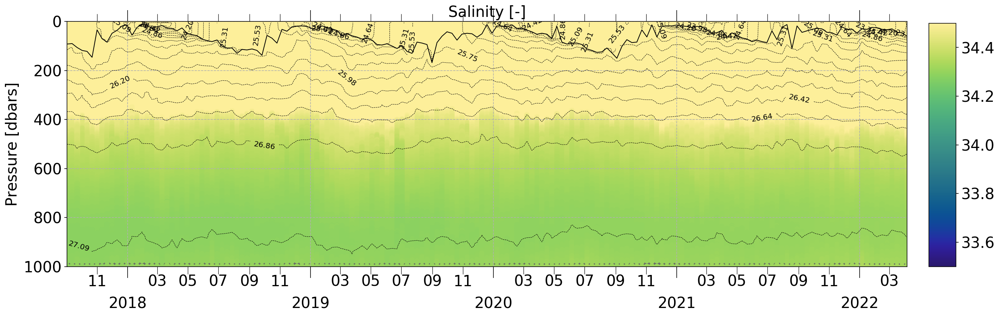

In [168]:
f = plot_property(X, Y, S, 
              CMAP = cmocean.cm.haline,
              VMIN = 33.5,
              VMAX = 34.5,
#               XMIN = datetime.strptime("2018-01-01", "%Y-%m-%d"),
#               XMAX = datetime.strptime("2006-01-01", "%Y-%m-%d"),
#               XMIN = xmin,
              YMAX = ymax,
              TITLE = "Salinity [-]",
              ZM_C = 'k', # color of mixed-layer depth
              MS = 60
             )

f.savefig(DIR_OUT+WMO+"/"+ WMO+"_S_" + str(ymax) + ".png")


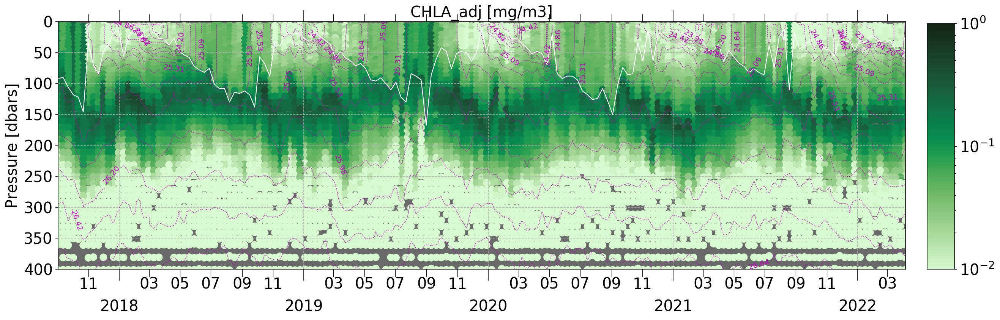

In [169]:
if "CHLA_adj" in locals():
    f = plot_property(X, Y, CHLA_adj, 
                  CMAP = cmocean.cm.algae,
                  VMIN = 0.01,
                  VMAX = 1,
#                   XMIN = xmin,
                  YMAX = 400,
                  TITLE = "CHLA_adj [mg/m3]",
                  ZM_C = 'w', # color of mixed-layer depth
                  S0_C = 'm',
                  LOG = True,
                  MS = 100
                 )

    f.savefig(DIR_OUT+WMO+"/"+ WMO+"_CHLA_adj_" + str(ymax) + ".png")



In [ ]:
if "CHLA" in locals():
    YMAX = 300
    f = plot_property(X, Y, CHLA-0.02, 
                  CMAP = cmocean.cm.algae,
                  VMIN = 0.02,
                  VMAX = 0.8,
    #               XMIN = datetime.strptime("2018-01-01", "%Y-%m-%d"),
#                       XMAX = datetime.strptime("2015-11-01", "%Y-%m-%d"),
                  YMAX = YMAX,
                  TITLE = "CHLA [mg/m3]",
                  ZM_C = 'w', # color of mixed-layer depth
                  S0_C = 'm',
                  LOG = True,
                  LW = 3,
                  MS = 100,
                 )

    f.savefig(DIR_OUT+WMO+"/"+ WMO+"_CHLA_" + str(YMAX) + ".png")



In [ ]:
if "BBP700" in locals():
    hex_list = ['#090914', '#111126', '#dedb45', '#9e6f50', '#b3472c', '#702c17', '#FF66CC']
    bbp_cmap = get_continuous_cmap(hex_list, float_list=[0,  0.215, 0.3, 0.4, 0.5, 0.55, 1]) # 

    f = plot_property(X, Y, BBP700, 
#                   CMAP = bbp_cmap, 
                  CMAP = cmocean.cm.matter,
                  VMIN = 0.0002,
                  VMAX = 0.0007,
#                   XMAX = datetime.strptime("2015-11-01", "%Y-%m-%d"),
                  YMAX = ymax,
                  TITLE = "BBP700 [1/m]",
                  ZM_C = 'w', # color of mixed-layer depth
                  S0_C = 'w', # color of sigma0
                  LW = 2,
                  MS = 140,
#                   LOG = True
                 )

    f.savefig(DIR_OUT+WMO+"/"+ WMO+"_BBP700_" + str(ymax) + ".png")


In [272]:
if "PAR" in locals():
    f = plot_property(X, Y, PAR, 
                  CMAP = cmocean.cm.thermal, #cm.get_cmap('cool'),
                  VMIN = 1,
                  VMAX = 1000,
    #               XMIN = datetime.strptime("2018-01-01", "%Y-%m-%d"),
                  YMAX = 300,
                  TITLE = "PAR [microMoleQuanta/m^2/sec]",
                  ZM_C = 'w', # color of mixed-layer depth
                  S0_C = 'w',
                  LOG = True
                 )

    f.savefig(DIR_OUT+WMO+"/"+ WMO+"_PAR_" + str(300) + ".png")


In [42]:
if "PAR" in locals():
    f = plot_property(X, Y, ED490, 
                  CMAP = cmocean.cm.thermal, #cm.get_cmap('cool'),
                  VMIN = 0.001,
                  VMAX = 1,
    #               XMIN = datetime.strptime("2018-01-01", "%Y-%m-%d"),
                  YMAX = 300,
                  TITLE = "ED490 [W/m^2/nm]",
                  ZM_C = 'w', # color of mixed-layer depth
                  S0_C = 'w',
                  LOG = True
                 )

    f.savefig(DIR_OUT+WMO+"/"+ WMO+"_ED490_" + str(300) + ".png")


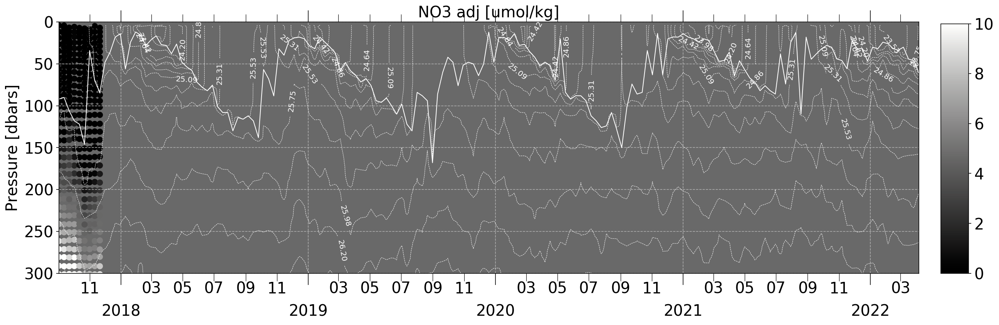

In [173]:
if "NO3_adj" in locals():
    f = plot_property(X, Y, NO3_adj, 
              CMAP = cmocean.cm.gray, #cm.get_cmap('cool'),
              VMIN = 0,
              VMAX = 10,
#               XMIN = datetime.strptime("2018-01-01", "%Y-%m-%d"),
              YMAX = 300,
              TITLE = "NO3 adj [umol/kg]",
              ZM_C = 'w', # color of mixed-layer depth
              S0_C = 'w',
#               LOG = True
             )

    f.savefig(DIR_OUT+WMO+"/"+ WMO+"_NO3_" + str(300) + ".png")


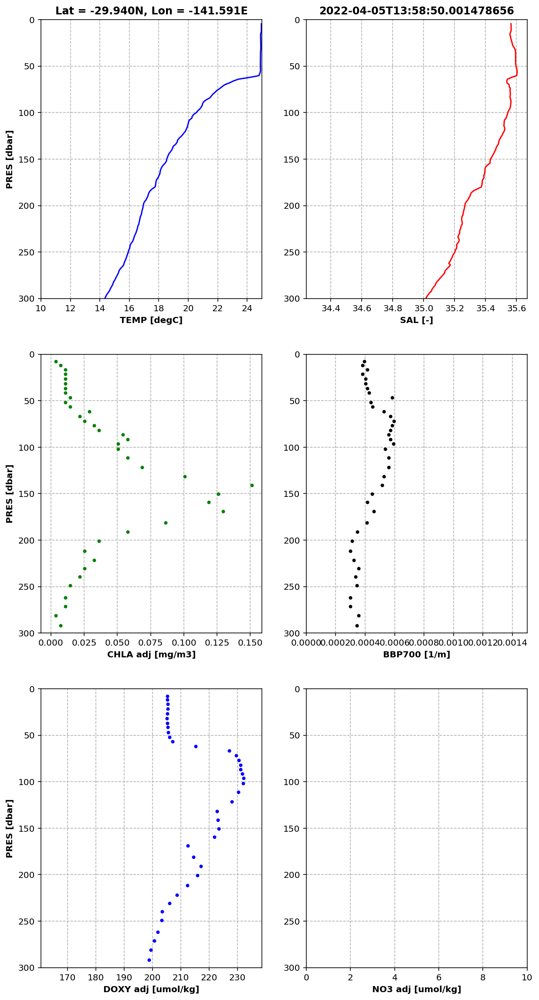

In [174]:
f, axs = plt.subplots(3,2, figsize=(10, 20))



axs[0,0].plot(T[:,-1], Y[:,-1], 'b-')
axs[0,0].set_ylim(300, 0)
axs[0,0].set_xlim(10, 25)
axs[0,0].set_xlabel('TEMP [degC]', fontweight='bold')
axs[0,0].set_ylabel('PRES [dbar]', fontweight='bold')
axs[0,0].grid(ls='--')

axs[0,0].set_title("Lat = %3.3fN, Lon = %3.3fE" % (LAT[-1,-1], LON[-1,-1]), fontweight='bold')

axs[0,1].plot(S[:,-1], Y[:,-1], 'r-')
axs[0,1].set_ylim(300, 0)
axs[0,1].set_xlabel('SAL [-]', fontweight='bold')
# axs[0,1].set_ylabel('PRES [dbar]')
axs[0,1].grid(ls='--')
axs[0,1].set_title(X[-1,-1], fontweight='bold')

if "CHLA" in locals():
    axs[1,0].plot(CHLA_adj[:,-1], Y[:,-1], 'g.')
    axs[1,0].set_ylim(300, 0)
    axs[1,0].set_xlabel('CHLA adj [mg/m3]', fontweight='bold')
    axs[1,0].set_ylabel('PRES [dbar]', fontweight='bold')
    axs[1,0].grid(ls='--')

    axs[1,1].plot(BBP700[:,-1], Y[:,-1], 'k.-')
    axs[1,1].set_ylim(300, 0)
    axs[1,1].set_xlim(0, 0.0015)
    axs[1,1].set_xlabel('BBP700 [1/m]', fontweight='bold')
    # axs[1,1].set_ylabel('PRES [dbar]')
    axs[1,1].grid(ls='--')

if "DOXY_adj" in locals():
    axs[2,0].plot(DOXY_adj[:,-1], Y[:,-1], 'b.')
    axs[2,0].set_ylim(300, 0)
#     axs[2,0].set_xlim(185, 205)
    axs[2,0].set_xlabel('DOXY adj [umol/kg]', fontweight='bold')
    axs[2,0].set_ylabel('PRES [dbar]', fontweight='bold')
    axs[2,0].grid(ls='--')

# axs[2,1].plot(PAR[:,-1], Y[:,-1], '.')
# axs[2,1].set_ylim(20, 0)
# # axs[2,1].set_xlim(0, 0.0015)
# axs[2,1].set_xlabel('PAR [umoleQuanta/m^2/sec]', fontweight='bold')
# # axs[1,1].set_ylabel('PRES [dbar]')
# axs[2,1].grid(ls='--')

if "NO3_adj" in locals():
    axs[2,1].plot(NO3_adj[:,-1], Y[:,-1], 'm.-')
    axs[2,1].set_ylim(300, 0)
    axs[2,1].set_xlim(0, 10)
    axs[2,1].set_xlabel('NO3 adj [umol/kg]', fontweight='bold')
    # axs[2,1].set_xlabel('PAR [umol/kg]', fontweight='bold')
    # axs[1,1].set_ylabel('PRES [dbar]')
    axs[2,1].grid(ls='--')

